## Import Packages & Load Data

In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#import enefit
import holidays
import datetime
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import warnings
warnings.filterwarnings('ignore')


In [45]:
train = pd.read_csv('../Enefit_Datasets/train.csv')
gas_df = pd.read_csv('../Enefit_Datasets/gas_prices.csv')
electricity_df = pd.read_csv('../Enefit_Datasets/electricity_prices.csv')
client_df = pd.read_csv('../Enefit_Datasets/client.csv')
fw_df = pd.read_csv('../Enefit_Datasets/forecast_weather.csv')
hw_df = pd.read_csv('../Enefit_Datasets/historical_weather.csv')
locations = pd.read_csv('../Enefit_Datasets/county_lon_lats.csv')

In [46]:
test = pd.read_csv('../Enefit_Datasets/example_test_files/test.csv')
gas_test = pd.read_csv('../Enefit_Datasets/example_test_files/gas_prices.csv')
electricity_test = pd.read_csv('../Enefit_Datasets/example_test_files/electricity_prices.csv')
client_test = pd.read_csv('../Enefit_Datasets/example_test_files/client.csv')
forecast_weather_test = pd.read_csv('../Enefit_Datasets/example_test_files/forecast_weather.csv')
hw_historical_weather_test = pd.read_csv('../Enefit_Datasets/example_test_files/historical_weather.csv')
revealed_targets = pd.read_csv('../Enefit_Datasets/example_test_files/revealed_targets.csv')
sample_prediction = pd.read_csv('../Enefit_Datasets/example_test_files/sample_submission.csv')

## Data Engineering

In [47]:
def TrainPreprocessing(train, client_df, fw_df, electricity_df, gas_df, locations, hw_df):
    '''Train data preprocessing'''
    
    # Drop nan values
    train = train[train['target'].notnull()]
    
    # Converting to datetime & date feature engineering
    train['datetime'] = pd.to_datetime(train['datetime'], utc=True)
    
    train['year'] = train['datetime'].dt.year
    train['quarter'] = train['datetime'].dt.quarter
    train['month'] = train['datetime'].dt.month
    train['week'] = train['datetime'].dt.isocalendar().week
    train['day'] = train['datetime'].dt.day
    train['hour'] = train['datetime'].dt.hour
    train['dayofweek'] = train['datetime'].dt.dayofweek
    train['dayofyear'] = train['datetime'].dt.dayofyear

    train['week'] = train['week'].astype('int32')
    
    train["jan_flag"] = (train["month"] == 1).astype(int)

    # Client data processing
    # Subtracting 2 from data_block_id. Data is two steps ahead
    client_df['data_block_id'] -= 2
    
    # Average installed capacity. (installed_capacity / eic_count)
    client_df['avg_installed_cap'] = client_df['installed_capacity'] / client_df['eic_count']

    
    # Electricity data processing
    # Renaming (forecast_date) to (datetime) for merging with the train data later
    electricity_df = electricity_df.rename(columns= {'forecast_date' : 'datetime'})
    
    # Converting (datetime) column to datetime
    electricity_df['datetime'] = pd.to_datetime(electricity_df['datetime'], utc= True)
    
    electricity_df['hour'] = electricity_df['datetime'].dt.hour
    
    # Locations data processing
    # Drop
    locations = locations.drop('Unnamed: 0', axis= 1) 
        

    # Forecast Weather 
    # 1. Rounding lat & lon to 1 decimal place
    # 2. Merge counties data from locations DF to lat & lon in forecast weather df
    # 3. Drop null rows
    # 4. Convert county col to int dtype
    # 5. Drop un-necessary columns
    # 6. Rename date column to 'datetime' and convert to datetime dtype
    # 7. New df with mean weather values per hour. Convert datetime back to normal datetime format in new df.
    # 8. New df with mean values per hour grouped also by county. Convert datetime col back to datetime.
    
    # 1.
    fw_df[['latitude', 'longitude']] = fw_df[['latitude', 'longitude']].astype(float).round(1)
    
    # 2.
    fw_df = fw_df.merge(locations, how='left', on=['latitude', 'longitude'])
    
    # 3.
    fw_df.dropna(axis=0, inplace=True)
    
    # 4.
    fw_df['county'] = fw_df['county'].astype('int64')
    
    # 5.
    fw_df.drop(['origin_datetime', 'latitude', 'longitude', 'hours_ahead',
               'data_block_id'], axis=1, inplace=True)
    
    # 6.
    fw_df.rename(columns={'forecast_datetime': 'datetime'}, inplace=True)
    fw_df['datetime'] = pd.to_datetime(fw_df['datetime'], utc=True)
    
    # 7.
    fw_df_mean = fw_df.groupby([fw_df['datetime']
                                .dt.to_period('h')])[list(fw_df.drop(['county', 'datetime'], axis=1)
                                                                           .columns)].mean().reset_index()
    fw_df_mean['datetime'] = pd.to_datetime(fw_df_mean['datetime'].dt.to_timestamp(), utc=True)
    
    # 8. 
    fw_df_county = fw_df.groupby(['county', fw_df['datetime'].dt.to_period('h')])[list(fw_df.drop(['county', 'datetime'], axis=1).columns)].mean().reset_index()
    fw_df_county['datetime'] = pd.to_datetime(fw_df_county['datetime'].dt.to_timestamp(), utc=True)

    
    # Historical weather df processing
    # 1. Rounding lat & lon to 1 decimal place
    # 2. Merge counties data from locations DF to lat & lon in forecast weather df
    # 3. Drop null rows
    # 4. Convert county col to int dtype
    # 5. Drop un-necessary columns
    # 6. Rename date column to 'datetime' and convert to datetime dtype
    # 7. New df with mean weather values per hour. Convert datetime back to normal datetime format in new df.
    # 8. New df with mean values per hour grouped also by county. Convert datetime col back to datetime.
    # 9. Merge data_block_id back to new county df
   
    # 1.
    hw_df[['latitude', 'longitude']] = hw_df[['latitude', 'longitude']].astype(float).round(1)
    
    # 2.
    hw_df = hw_df.merge(locations, how='left', on=['longitude', 'latitude'])
    
    # 3.
    hw_df.dropna(axis=0, inplace=True)
    
    # 4.
    hw_df['county'] = hw_df['county'].astype('int64')
    
    # 5.
    hw_df.drop(['latitude', 'longitude'], axis=1, inplace=True)
    
    # 6.
    hw_df['datetime'] = pd.to_datetime(hw_df['datetime'], utc=True)
    
    # 7.
    hw_df_mean = hw_df.groupby([hw_df['datetime']
                                .dt.to_period('h')])[list(hw_df.drop(['county', 'datetime', 'data_block_id'], axis=1)
                                                                           .columns)].mean().reset_index()
    hw_df_mean['datetime'] = pd.to_datetime(hw_df_mean['datetime'].dt.to_timestamp(), utc=True)
    
    hw_df_mean = hw_df_mean.merge(hw_df[['datetime', 'data_block_id']], how='left', on='datetime')
    
    # 8. 
    hw_df_county = hw_df.groupby(['county', hw_df['datetime'].dt.to_period('h')])[list(hw_df.drop(['county', 'datetime', 'data_block_id'], axis=1).columns)].mean().reset_index()
    hw_df_county['datetime'] = pd.to_datetime(hw_df_county['datetime'].dt.to_timestamp(), utc=True)
    hw_df_county = hw_df_county.merge(hw_df[['datetime', 'data_block_id']], how='left', on='datetime')
    hw_df_county.drop_duplicates(inplace=True)
    hw_df_county.reset_index()
    
    # Merge the data into train set
    # 1. Merge client 
    # 2. Merge gas
    # 3. Merge electricity
    # 4. Merge forecast weather
    # 5. Merge forecast weather by county
    # 6. Add hour col to hist weather and hist county. Drop dups and datetime col
    # 7. Merge hist weather menas
    # 8. Merge hist weather means by county
    # 9. Fill null values with forward and backward method
    # 10. Drop un-necessary cols...?

    
    # 1
    train = train.merge(client_df.drop(columns = ['date']), how='left', on = ['data_block_id', 'county', 'is_business', 'product_type'])
    
    # 2
    train = train.merge(gas_df[['data_block_id', 'lowest_price_per_mwh', 'highest_price_per_mwh']], how='left', on='data_block_id')
    
    # 3
    train = train.merge(electricity_df[['euros_per_mwh', 'hour', 'data_block_id']], how='left', on=['hour','data_block_id'])
    
    # 4 
    train = train.merge(fw_df_mean, how='left', on='datetime')
    
    # 5 
    train = train.merge(fw_df_county, how='left', on=['datetime', 'county'], suffixes = ('_fcast_mean', '_fcast_mean_by_county'))
    
    # 6
    hw_df_mean['hour'] = hw_df_mean['datetime'].dt.hour
    hw_df_county['hour'] = hw_df_county['datetime'].dt.hour
    
    hw_df_mean.drop_duplicates(inplace=True)
    hw_df_county.drop_duplicates(inplace=True)
    hw_df_mean.drop('datetime', axis=1, inplace=True)
    hw_df_county.drop('datetime', axis=1, inplace=True)

    # 7
    train = train.merge(hw_df_mean, how='left', on=['data_block_id', 'hour'])
    
    # 8 
    train = train.merge(hw_df_county, how='left', on=['data_block_id', 'county', 'hour'], suffixes= ('_hist_mean', '_hist_mean_by_county'))
    
    # 9
    train = train.groupby(['year', 'day', 'hour'], as_index=False).apply(lambda x: x.ffill().bfill()).reset_index()
    
    # 10
    train.drop(['row_id', 'data_block_id'], axis = 1, inplace = True)
    
    # Normalize target by dividing against installed capacity
    train['installed_capacity'] = train['installed_capacity'].fillna(1000)
    train['target'] = train['target'] / train['installed_capacity']

    return train

In [48]:
def is_holiday(dataframe):
    '''Creates is_holiday boolean column for Estonian country wide holidays'''
    estonian_holidays = holidays.country_holidays('EE', years=range(2021, 2024))
    estonian_holidays = list(estonian_holidays.keys())

    
    dataframe['is_holiday'] = dataframe.apply(lambda row: (datetime.date(row['year'], row['month'], row['day']) in estonian_holidays) * 1, axis=1)
    return dataframe

In [49]:
def create_target_lags(df, N_lags):
    '''Lag target variables are a form of feature engineering that gives
    the model context for what the target was N days ago'''
    
    # Store datetime column in a python object
    og_datetime = df['datetime']
    
    # Store important variables to reference with target
    target_and_friends = df[['datetime', 'prediction_unit_id', 'is_consumption', 'target']].copy()
    
    # Create lagged targets
    for lag in range(1, N_lags + 1): # Starts at 2, ends at set day
        target_and_friends['datetime'] = og_datetime + pd.DateOffset(lag) # Shifts dates forward by set amount (lag)
        df = df.merge(target_and_friends, how='left', on=['datetime', 'prediction_unit_id', 'is_consumption'], suffixes = ('', f'_lag_{lag}_days_ago'))
        
    return df

In [50]:
def fill_nan_with_weekly_median(df, timestamp_column='datetime'):
    """
    Fill NaN values in a DataFrame with the median from the respective week.

    Parameters:
    - df: DataFrame, the input DataFrame
    - timestamp_column: str, the column name representing the timestamp (default: 'datetime')

    Returns:
    - DataFrame with NaN values filled using weekly medians
    """
    # Step 1: Extract the week number
    df['week_number'] = df[timestamp_column].dt.isocalendar().week

    # Step 2: Calculate median for each feature within each week
    weekly_medians = df.groupby('week_number').median()

    # Step 3: Fill NaN values using the weekly medians
    for feature in df.columns:
        if feature != timestamp_column and feature != 'week_number':
            df[feature].fillna(df['week_number'].map(weekly_medians[feature]), inplace=True)

    # Drop the 'week_number' column if you don't need it anymore
    df.drop('week_number', axis=1, inplace=True)

    return df


In [51]:
# Train preprocessing
train = TrainPreprocessing(train, client_df, fw_df, electricity_df, gas_df, locations, hw_df)

# Add holidays
train = is_holiday(train)

# Add target lags
N_lags = 3
train = create_target_lags(train, N_lags)

# Fill NaN values with weekly median
train = fill_nan_with_weekly_median(train, timestamp_column='datetime')

train.tail()

,index,county,is_business,product_type,target,is_consumption,datetime,prediction_unit_id,year,quarter,month,week,day,hour,dayofweek,dayofyear,jan_flag,eic_count,installed_capacity,avg_installed_cap,lowest_price_per_mwh,highest_price_per_mwh,euros_per_mwh,temperature_fcast_mean,dewpoint_fcast_mean,cloudcover_high_fcast_mean,cloudcover_low_fcast_mean,cloudcover_mid_fcast_mean,cloudcover_total_fcast_mean,10_metre_u_wind_component_fcast_mean,10_metre_v_wind_component_fcast_mean,direct_solar_radiation_fcast_mean,surface_solar_radiation_downwards_fcast_mean,snowfall_fcast_mean,total_precipitation_fcast_mean,temperature_fcast_mean_by_county,dewpoint_fcast_mean_by_county,cloudcover_high_fcast_mean_by_county,cloudcover_low_fcast_mean_by_county,cloudcover_mid_fcast_mean_by_county,cloudcover_total_fcast_mean_by_county,10_metre_u_wind_component_fcast_mean_by_county,10_metre_v_wind_component_fcast_mean_by_county,direct_solar_radiation_fcast_mean_by_county,surface_solar_radiation_downwards_fcast_mean_by_county,snowfall_fcast_mean_by_county,total_precipitation_fcast_mean_by_county,temperature_hist_mean,dewpoint_hist_mean,rain_hist_mean,snowfall_hist_mean,surface_pressure_hist_mean,cloudcover_total_hist_mean,cloudcover_low_hist_mean,cloudcover_mid_hist_mean,cloudcover_high_hist_mean,windspeed_10m_hist_mean,winddirection_10m_hist_mean,shortwave_radiation_hist_mean,direct_solar_radiation_hist_mean,diffuse_radiation_hist_mean,temperature_hist_mean_by_county,dewpoint_hist_mean_by_county,rain_hist_mean_by_county,snowfall_hist_mean_by_county,surface_pressure_hist_mean_by_county,cloudcover_total_hist_mean_by_county,cloudcover_low_hist_mean_by_county,cloudcover_mid_hist_mean_by_county,cloudcover_high_hist_mean_by_county,windspeed_10m_hist_mean_by_county,winddirection_10m_hist_mean_by_county,shortwave_radiation_hist_mean_by_county,direct_solar_radiation_hist_mean_by_county,diffuse_radiation_hist_mean_by_county,is_holiday,target_lag_1_days_ago,target_lag_2_days_ago,target_lag_3_days_ago
2017819,2017819,15,1,0,0.119775,1,2023-05-31 23:00:00+00:00,64,2023,2,5,22,31,23,2,151,0,46.0,1646.7,35.797826,29.0,34.0,-1.29,9.618997,4.736512,0.216945,0.034654,0.01901,0.255282,4.330831,-2.695959,0.0,0.0,0.0,0.0,8.790161,4.069385,0.800964,0.0,0.0,0.800964,3.683009,-0.604116,0.0,0.0,0.0,0.0,9.729333,2.834667,0.0,0.0,1013.714667,52.853333,0.453333,59.693333,55.386667,2.38963,238.093333,0.0,0.0,0.0,11.18,6.98,0.0,0.0,1003.74,21.2,2.8,16.4,29.8,1.772222,170.0,0.0,0.0,0.0,0,0.246428,0.303495,0.279110
2017820,2017820,15,1,1,0.000000,0,2023-05-31 23:00:00+00:00,59,2023,2,5,22,31,23,2,151,0,46.0,1646.7,35.797826,29.0,34.0,-1.29,9.618997,4.736512,0.216945,0.034654,0.01901,0.255282,4.330831,-2.695959,0.0,0.0,0.0,0.0,8.790161,4.069385,0.800964,0.0,0.0,0.800964,3.683009,-0.604116,0.0,0.0,0.0,0.0,9.729333,2.834667,0.0,0.0,1013.714667,52.853333,0.453333,59.693333,55.386667,2.38963,238.093333,0.0,0.0,0.0,11.18,6.98,0.0,0.0,1003.74,21.2,2.8,16.4,29.8,1.772222,170.0,0.0,0.0,0.0,0,0.000000,0.000000,0.000000
2017821,2017821,15,1,1,0.017249,1,2023-05-31 23:00:00+00:00,59,2023,2,5,22,31,23,2,151,0,46.0,1646.7,35.797826,29.0,34.0,-1.29,9.618997,4.736512,0.216945,0.034654,0.01901,0.255282,4.330831,-2.695959,0.0,0.0,0.0,0.0,8.790161,4.069385,0.800964,0.0,0.0,0.800964,3.683009,-0.604116,0.0,0.0,0.0,0.0,9.729333,2.834667,0.0,0.0,1013.714667,52.853333,0.453333,59.693333,55.386667,2.38963,238.093333,0.0,0.0,0.0,11.18,6.98,0.0,0.0,1003.74,21.2,2.8,16.4,29.8,1.772222,170.0,0.0,0.0,0.0,0,0.017970,0.050415,0.056392
2017822,2017822,15,1,3,0.000000,0,2023-05-31 23:00:00+00:00,60,2023,2,5,22,31,23,2,151,0,46.0,1646.7,35.797826,29.0,34.0,-1.29,9.618997,4.736512,0.216945,0.034654,0.01901,0.255282,4.330831,-2.695959,0.0,0.0,0.0,0.0,8.790161,4.069385,0.800964,0.0,0.0,0.800964,3.683009,-0.604116,0.0,0.0,0.0,0.0,9.729333,2.834667,0.0,0.0,1013.714667,52.853333,0.453333,59.693333,55.386667,2.38963,238.093333,0.0,0.0,0.0,11.18,6.98,0.0,0.0,1003.74,21.2,2.8,16.4,29.8,1.772222,170.0,0.0,0.0,0.0,0,0.000000,0.0000

In [52]:
# Drop year column as its no longer needed
train.drop(['year'], axis=1, inplace=True)

In [53]:
# Further feature engineering

# Convert datetime to integer for date features
train['datetime'] = train['datetime'].astype('int64')

train['sin_hour']= (np.pi * np.sin(train['hour']) / 12)
train['cos_hour']= (np.pi * np.cos(train['hour']) / 12)
train['sin_dayofyear']= (np.pi * np.sin(train['dayofyear']) / 183)
train['cos_dayofyear']= (np.pi * np.cos(train['dayofyear']) / 183)
train['target_mean']= train[[f"target_lag_{i}_days_ago" for i in range(1, N_lags+ 1)]].mean(1)
train['target_std']= train[[f"target_lag_{i}_days_ago" for i in range(1, N_lags + 1)]].std(1)
train['target_var']= train[[f"target_lag_{i}_days_ago" for i in range(1, N_lags+ 1)]].var(1)


In [54]:
# Log columns with outliers
to_log= ['installed_capacity', 'euros_per_mwh', 'temperature_fcast_mean', 'dewpoint_fcast_mean',
        'cloudcover_high_fcast_mean', 'cloudcover_low_fcast_mean', 'cloudcover_mid_fcast_mean', 'cloudcover_total_fcast_mean',
        '10_metre_u_wind_component_fcast_mean', 'direct_solar_radiation_fcast_mean',
        'snowfall_fcast_mean', 'total_precipitation_fcast_mean', 'temperature_fcast_mean_by_county', 'dewpoint_fcast_mean_by_county',
        'cloudcover_high_fcast_mean_by_county', 'cloudcover_low_fcast_mean_by_county', 'cloudcover_mid_fcast_mean_by_county',
        'cloudcover_total_fcast_mean_by_county', '10_metre_u_wind_component_fcast_mean_by_county', '10_metre_v_wind_component_fcast_mean', '10_metre_v_wind_component_fcast_mean_by_county',
        'surface_solar_radiation_downwards_fcast_mean_by_county', 'snowfall_fcast_mean_by_county', 'total_precipitation_fcast_mean_by_county',
        'rain_hist_mean', 'snowfall_hist_mean', 'windspeed_10m_hist_mean_by_county', 'target_lag_1_days_ago', 'target_lag_2_days_ago', 
        'target_lag_3_days_ago', 'target_mean', 'target_std', 'target_var']
for i in to_log:
    shifted_feature = train[i] - min(train[i]) + 1e-10
    
    train[f"log_{i}"] = np.where((train[i] != 0), np.log(shifted_feature), 0) #Create new col and log the value if not 0
    

In [55]:
# Sort by datetime
train.sort_values(['datetime', 'hour'], inplace=True)

In [56]:
# drop index column
train.drop('index', axis=1, inplace=True)

In [57]:
train.shape

(2017824, 117)

In [58]:
# Set the display options to show all rows and columns
pd.set_option('display.max_columns', None)

train.head(900000)

,county,is_business,product_type,target,is_consumption,datetime,prediction_unit_id,quarter,month,week,day,hour,dayofweek,dayofyear,jan_flag,eic_count,installed_capacity,avg_installed_cap,lowest_price_per_mwh,highest_price_per_mwh,euros_per_mwh,temperature_fcast_mean,dewpoint_fcast_mean,cloudcover_high_fcast_mean,cloudcover_low_fcast_mean,cloudcover_mid_fcast_mean,cloudcover_total_fcast_mean,10_metre_u_wind_component_fcast_mean,10_metre_v_wind_component_fcast_mean,direct_solar_radiation_fcast_mean,surface_solar_radiation_downwards_fcast_mean,snowfall_fcast_mean,total_precipitation_fcast_mean,temperature_fcast_mean_by_county,dewpoint_fcast_mean_by_county,cloudcover_high_fcast_mean_by_county,cloudcover_low_fcast_mean_by_county,cloudcover_mid_fcast_mean_by_county,cloudcover_total_fcast_mean_by_county,10_metre_u_wind_component_fcast_mean_by_county,10_metre_v_wind_component_fcast_mean_by_county,direct_solar_radiation_fcast_mean_by_county,surface_solar_radiation_downwards_fcast_mean_by_county,snowfall_fcast_mean_by_county,total_precipitation_fcast_mean_by_county,temperature_hist_mean,dewpoint_hist_mean,rain_hist_mean,snowfall_hist_mean,surface_pressure_hist_mean,cloudcover_total_hist_mean,cloudcover_low_hist_mean,cloudcover_mid_hist_mean,cloudcover_high_hist_mean,windspeed_10m_hist_mean,winddirection_10m_hist_mean,shortwave_radiation_hist_mean,direct_solar_radiation_hist_mean,diffuse_radiation_hist_mean,temperature_hist_mean_by_county,dewpoint_hist_mean_by_county,rain_hist_mean_by_county,snowfall_hist_mean_by_county,surface_pressure_hist_mean_by_county,cloudcover_total_hist_mean_by_county,cloudcover_low_hist_mean_by_county,cloudcover_mid_hist_mean_by_county,cloudcover_high_hist_mean_by_county,windspeed_10m_hist_mean_by_county,winddirection_10m_hist_mean_by_county,shortwave_radiation_hist_mean_by_county,direct_solar_radiation_hist_mean_by_county,diffuse_radiation_hist_mean_by_county,is_holiday,target_lag_1_days_ago,target_lag_2_days_ago,target_lag_3_days_ago,sin_hour,cos_hour,sin_dayofyear,cos_dayofyear,target_mean,target_std,target_var,log_installed_capacity,log_euros_per_mwh,log_temperature_fcast_mean,log_dewpoint_fcast_mean,log_cloudcover_high_fcast_mean,log_cloudcover_low_fcast_mean,log_cloudcover_mid_fcast_mean,log_cloudcover_total_fcast_mean,log_10_metre_u_wind_component_fcast_mean,log_direct_solar_radiation_fcast_mean,log_snowfall_fcast_mean,log_total_precipitation_fcast_mean,log_temperature_fcast_mean_by_county,log_dewpoint_fcast_mean_by_county,log_cloudcover_high_fcast_mean_by_county,log_cloudcover_low_fcast_mean_by_county,log_cloudcover_mid_fcast_mean_by_county,log_cloudcover_total_fcast_mean_by_county,log_10_metre_u_wind_component_fcast_mean_by_county,log_10_metre_v_wind_component_fcast_mean,log_10_metre_v_wind_component_fcast_mean_by_county,log_surface_solar_radiation_downwards_fcast_mean_by_county,log_snowfall_fcast_mean_by_county,log_total_precipitation_fcast_mean_by_county,log_rain_hist_mean,log_snowfall_hist_mean,log_windspeed_10m_hist_mean_by_county,log_target_lag_1_days_ago,log_target_lag_2_days_ago,log_target_lag_3_days_ago,log_target_mean,log_target_std,log_target_var
0,0,0,1,0.000748,0,1630454400000000000,0,3,9,35,1,0,2,244,0,108.0,952.89,8.823056,50.15,69.99,71.36,13.014066,10.531545,0.256954,0.213331,0.069662,0.438023,1.970332,-5.205125,0.000000,0.000000,0.0,0.0,13.279187,10.265674,0.192630,0.036087,0.005286,0.215636,2.511035,-5.096591,0.000000,0.000000,0.0,0.0,8.982667,6.233333,0.0,0.000000,1026.648000,85.293333,82.56,20.013333,1.413333,4.854074,145.973333,3.786667,1.186667,2.600000,8.840000,6.710000,0.0,0.0,1028.510000,93.3,87.6,24.200000,0.0,4.169444,143.0,0.000000,0.000000,0.0,0,0.061467,0.058378,0.056065,0.000000,0.261799,-0.014842,0.008628,0.058637,0.002710,0.000007,6.853711,4.399621,3.350600,3.349613,-1.358858,-1.544909,-2.664093,-0.825485,2.337719,0.00000,0.0,0.0,3.580888,3.559222,-1.646984,-3.321822,-5.242761,-1.534165,2.714133,1.911429,2.556397,0.000000,0.0,0.0,0.0,0.000000,1.427783,-2.789250,-2.840813

In [59]:
# Drop nan values
pd.set_option('display.max_rows', 120)

nan = train.isna().sum()
nan

county                                                        0
is_business                                                   0
product_type                                                  0
target                                                        0
is_consumption                                                0
datetime                                                      0
prediction_unit_id                                            0
quarter                                                       0
month                                                         0
week                                                          0
day                                                           0
hour                                                          0
dayofweek                                                     0
dayofyear                                                     0
jan_flag                                                      0
eic_count                               

In [60]:
train.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2017824 entries, 0 to 2017823
Data columns (total 117 columns):
 #    Column                                                      Dtype  
---   ------                                                      -----  
 0    county                                                      int64  
 1    is_business                                                 int64  
 2    product_type                                                int64  
 3    target                                                      float64
 4    is_consumption                                              int64  
 5    datetime                                                    int64  
 6    prediction_unit_id                                          int64  
 7    quarter                                                     int64  
 8    month                                                       int64  
 9    week                                                        int32 

In [41]:
# Make features floats (better for LSTMs)
train = train.astype(float)

In [42]:
train.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2017824 entries, 0 to 2017823
Data columns (total 117 columns):
 #    Column                                                      Dtype  
---   ------                                                      -----  
 0    county                                                      float64
 1    is_business                                                 float64
 2    product_type                                                float64
 3    target                                                      float64
 4    is_consumption                                              float64
 5    datetime                                                    float64
 6    prediction_unit_id                                          float64
 7    quarter                                                     float64
 8    month                                                       float64
 9    week                                                        float6

## Visualization

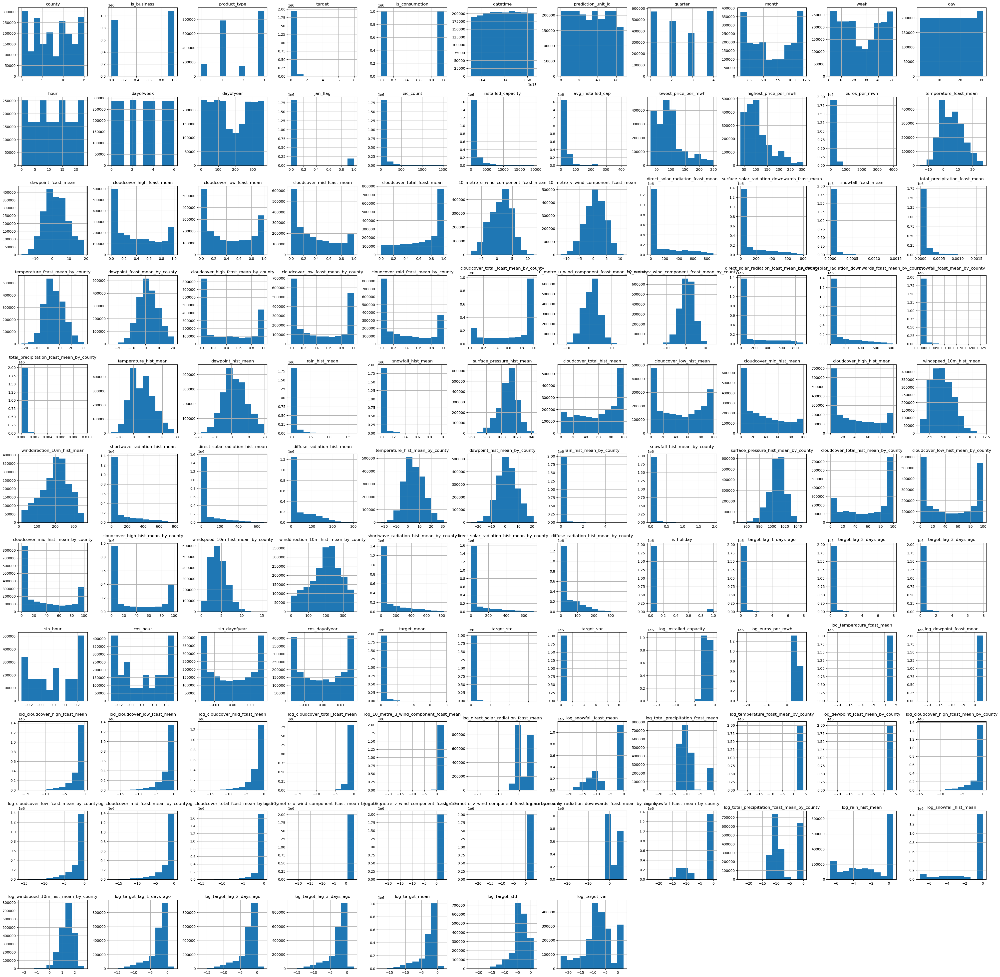

In [19]:
# Plot histogram for each variable
train.hist(figsize=(50, 50))
plt.show()


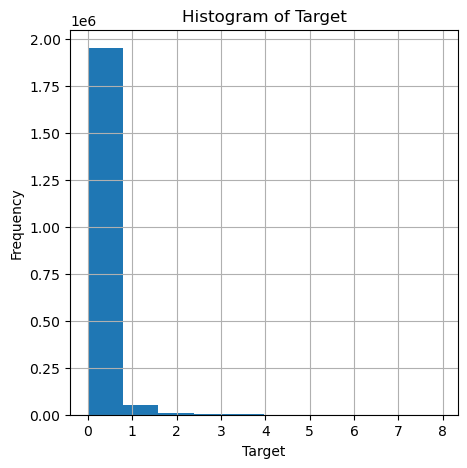

In [20]:
train['target'].hist(figsize=(5, 5))
plt.xlabel('Target')
plt.ylabel('Frequency')
plt.title('Histogram of Target')
plt.show()


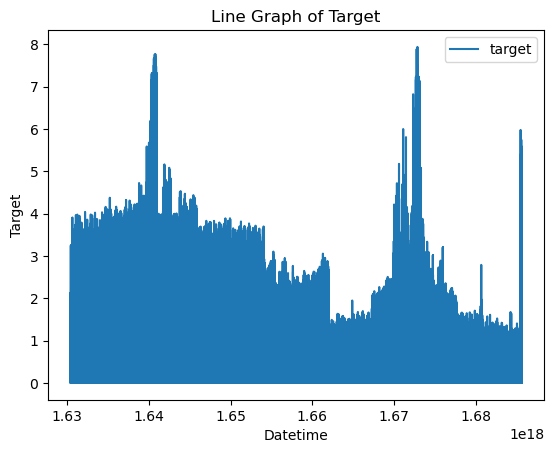

In [21]:
# Plot line graph
train.plot(x='datetime', y='target', kind='line')

# Set labels and title
plt.xlabel('Datetime')
plt.ylabel('Target')
plt.title('Line Graph of Target')

# Display the graph
plt.show()


## Modeling

In [22]:
# Select features and targets for consumption and production

consumption_X = train[train['is_consumption'] == 1].drop(['is_consumption', 'target'], axis=1)
consumption_y = train[train['is_consumption'] == 1]['target']

production_X = train[train['is_consumption'] == 0].drop(['is_consumption', 'target'], axis=1)
production_y = train[train['is_consumption'] == 0]['target']

In [23]:
# Normalize features

scaler = MinMaxScaler()
consumption_X = scaler.fit_transform(consumption_X)
production_X = scaler.fit_transform(production_X)

In [24]:
# Split into train and test sets

consumption_X_train, consumption_X_test, consumption_y_train, consumption_y_test = train_test_split(consumption_X, consumption_y, test_size=0.2, random_state=42)
production_X_train, production_X_test, production_y_train, production_y_test = train_test_split(production_X, production_y, test_size=0.2, random_state=42)


In [25]:
# Reshape features for LSTM
consumption_X_train = consumption_X_train.reshape((consumption_X_train.shape[0], 1, consumption_X_train.shape[1]))
consumption_X_test = consumption_X_test.reshape((consumption_X_test.shape[0], 1, consumption_X_test.shape[1]))

production_X_train = production_X_train.reshape((production_X_train.shape[0], 1, production_X_train.shape[1]))
production_X_test = production_X_test.reshape((production_X_test.shape[0], 1, production_X_test.shape[1]))

In [26]:
# Build LSTM model

# Consumption
consumption_model = Sequential()
consumption_model.add(LSTM(50, activation='relu', input_shape=(consumption_X_train.shape[1], consumption_X_train.shape[2])))
consumption_model.add(Dense(1))
consumption_model.compile(loss='mae', optimizer='adam')

# Production
production_model = Sequential()
production_model.add(LSTM(50, activation='relu', input_shape=(production_X_train.shape[1], production_X_train.shape[2])))
production_model.add(Dense(1))
production_model.compile(loss='mae', optimizer='adam')


Metal device set to: Apple M1 Pro

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB



2024-01-17 19:10:45.868547: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-01-17 19:10:45.869919: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [27]:
# Fit LSTM model
consumption_history = consumption_model.fit(consumption_X_train, consumption_y_train, 
                                            epochs=5, batch_size=72, 
                                            validation_data=(consumption_X_test, consumption_y_test), 
                                            verbose=2, shuffle=False)

production_history = production_model.fit(production_X_train, production_y_train, 
                                          epochs=5, batch_size=72, 
                                          validation_data=(production_X_test, production_y_test), 
                                          verbose=2, shuffle=False)



Epoch 1/5


2024-01-17 19:10:46.868723: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2024-01-17 19:10:47.318898: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2024-01-17 19:12:47.080751: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


11211/11211 - 133s - loss: 0.0570 - val_loss: 0.0519 - 133s/epoch - 12ms/step
Epoch 2/5
11211/11211 - 134s - loss: 0.0495 - val_loss: 0.0488 - 134s/epoch - 12ms/step
Epoch 3/5
11211/11211 - 136s - loss: 0.0483 - val_loss: 0.0484 - 136s/epoch - 12ms/step
Epoch 4/5
11211/11211 - 138s - loss: 0.0474 - val_loss: 0.0470 - 138s/epoch - 12ms/step
Epoch 5/5
11211/11211 - 132s - loss: 0.0468 - val_loss: 0.0461 - 132s/epoch - 12ms/step
Epoch 1/5


2024-01-17 19:22:01.591111: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2024-01-17 19:24:04.634920: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


11211/11211 - 137s - loss: 0.0225 - val_loss: 0.0202 - 137s/epoch - 12ms/step
Epoch 2/5
11211/11211 - 141s - loss: 0.0201 - val_loss: 0.0196 - 141s/epoch - 13ms/step
Epoch 3/5
11211/11211 - 143s - loss: 0.0194 - val_loss: 0.0193 - 143s/epoch - 13ms/step
Epoch 4/5
11211/11211 - 134s - loss: 0.0189 - val_loss: 0.0188 - 134s/epoch - 12ms/step
Epoch 5/5
11211/11211 - 138s - loss: 0.0185 - val_loss: 0.0191 - 138s/epoch - 12ms/step


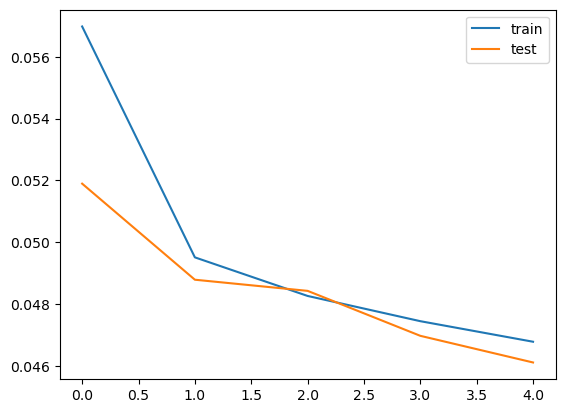

In [28]:
# Plot consumption loss
plt.plot(consumption_history.history['loss'], label='train')
plt.plot(consumption_history.history['val_loss'], label='test')
plt.legend()
plt.show()


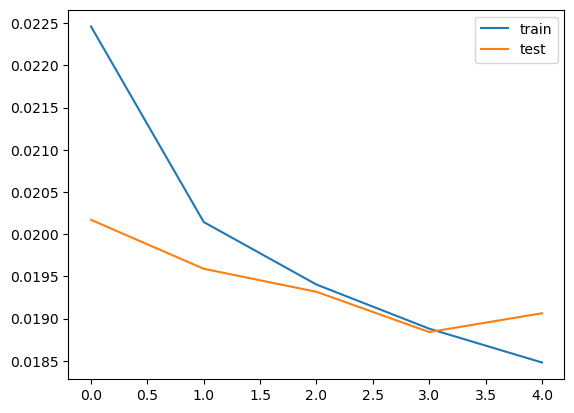

In [29]:
# Plot production loss
plt.plot(production_history.history['loss'], label='train')
plt.plot(production_history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [30]:
# Make predictions
consumption_yhat = consumption_model.predict(consumption_X_test)

production_yhat = production_model.predict(production_X_test)

  26/6306 [..............................] - ETA: 26s 

2024-01-17 19:33:35.092444: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


  20/6306 [..............................] - ETA: 34s 

2024-01-17 19:34:04.052928: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


6306/6306 [==============================] - 27s 4ms/step


In [31]:
# Evaluate MAE
from sklearn.metrics import mean_absolute_error

consumption_mae = mean_absolute_error(consumption_y_test, consumption_yhat)
print('Consumption MAE: %.3f' % consumption_mae)

production_mae = mean_absolute_error(production_y_test, production_yhat)
print('Production MAE: %.3f' % production_mae)

Consumption MAE: 0.046
Production MAE: 0.019


## Visualizing Results

In [229]:
def forcasted_results_consumption(x_df, yhat_df, y_df, base_df):
    '''Returns a dataframe with the forcasted results'''

    # Reshape features from 3D to 2D
    #x_df = x_df.reshape(x_df.shape[0], -1)

    y_df = np.array(y_df)
    # Convert features to dataframe
    consumption_df = pd.DataFrame(x_df)
    consumption_y = pd.DataFrame(y_df)
    consumption_yhat = pd.DataFrame(yhat_df)

    # Inverse transform features
    consumption_df = scaler.inverse_transform(consumption_df)
    consumption_df = pd.DataFrame(consumption_df)

    # Add actual targets to features dataframe
    consumption_df['actual_target'] = consumption_y
    actual_target_feat = consumption_df.pop('actual_target')
    consumption_df.insert(3, 'actual_target', actual_target_feat)

    # Add consumption column, set to 1
    consumption_df['is_consumption'] = 1
    consumption_feat = consumption_df.pop('is_consumption')
    consumption_df.insert(4, 'is_consumption', consumption_feat)
    
    #Rename columns back to origional names
    headers = base_df.columns
    consumption_df = consumption_df.rename(columns=dict(zip(consumption_df.columns, headers)))

    # Add predicted targets to features dataframe
    consumption_df['predicted_target'] = consumption_yhat
    predicted_target_feat = consumption_df.pop('predicted_target')

    # Insert the feature at the desired index
    consumption_df.insert(4, 'predicted_target', predicted_target_feat)

    # Convert to datetime format
    consumption_df['datetime'] = pd.to_datetime(consumption_df['datetime'])

    # Sort by datetime
    consumption_df.sort_values(['datetime', 'hour'], inplace=True)

    # Reset index
    consumption_df.reset_index(inplace=True)

    return consumption_df

In [230]:
consumption_df = forcasted_results_consumption(consumption_X_test, consumption_yhat, consumption_y_test, train)

In [231]:
consumption_df

,index,county,is_business,product_type,target,predicted_target,is_consumption,datetime,prediction_unit_id,quarter,month,week,day,hour,dayofweek,dayofyear,jan_flag,eic_count,installed_capacity,avg_installed_cap,lowest_price_per_mwh,highest_price_per_mwh,euros_per_mwh,temperature_fcast_mean,dewpoint_fcast_mean,cloudcover_high_fcast_mean,cloudcover_low_fcast_mean,cloudcover_mid_fcast_mean,cloudcover_total_fcast_mean,10_metre_u_wind_component_fcast_mean,10_metre_v_wind_component_fcast_mean,direct_solar_radiation_fcast_mean,surface_solar_radiation_downwards_fcast_mean,snowfall_fcast_mean,total_precipitation_fcast_mean,temperature_fcast_mean_by_county,dewpoint_fcast_mean_by_county,cloudcover_high_fcast_mean_by_county,cloudcover_low_fcast_mean_by_county,cloudcover_mid_fcast_mean_by_county,cloudcover_total_fcast_mean_by_county,10_metre_u_wind_component_fcast_mean_by_county,10_metre_v_wind_component_fcast_mean_by_county,direct_solar_radiation_fcast_mean_by_county,surface_solar_radiation_downwards_fcast_mean_by_county,snowfall_fcast_mean_by_county,total_precipitation_fcast_mean_by_county,temperature_hist_mean,dewpoint_hist_mean,rain_hist_mean,snowfall_hist_mean,surface_pressure_hist_mean,cloudcover_total_hist_mean,cloudcover_low_hist_mean,cloudcover_mid_hist_mean,cloudcover_high_hist_mean,windspeed_10m_hist_mean,winddirection_10m_hist_mean,shortwave_radiation_hist_mean,direct_solar_radiation_hist_mean,diffuse_radiation_hist_mean,temperature_hist_mean_by_county,dewpoint_hist_mean_by_county,rain_hist_mean_by_county,snowfall_hist_mean_by_county,surface_pressure_hist_mean_by_county,cloudcover_total_hist_mean_by_county,cloudcover_low_hist_mean_by_county,cloudcover_mid_hist_mean_by_county,cloudcover_high_hist_mean_by_county,windspeed_10m_hist_mean_by_county,winddirection_10m_hist_mean_by_county,shortwave_radiation_hist_mean_by_county,direct_solar_radiation_hist_mean_by_county,diffuse_radiation_hist_mean_by_county,is_holiday,target_lag_1_days_ago,target_lag_2_days_ago,target_lag_3_days_ago,sin_hour,cos_hour,sin_dayofyear,cos_dayofyear,target_mean,target_std,target_var,log_installed_capacity,log_euros_per_mwh,log_temperature_fcast_mean,log_dewpoint_fcast_mean,log_cloudcover_high_fcast_mean,log_cloudcover_low_fcast_mean,log_cloudcover_mid_fcast_mean,log_cloudcover_total_fcast_mean,log_10_metre_u_wind_component_fcast_mean,log_direct_solar_radiation_fcast_mean,log_snowfall_fcast_mean,log_total_precipitation_fcast_mean,log_temperature_fcast_mean_by_county,log_dewpoint_fcast_mean_by_county,log_cloudcover_high_fcast_mean_by_county,log_cloudcover_low_fcast_mean_by_county,log_cloudcover_mid_fcast_mean_by_county,log_cloudcover_total_fcast_mean_by_county,log_10_metre_u_wind_component_fcast_mean_by_county,log_10_metre_v_wind_component_fcast_mean,log_10_metre_v_wind_component_fcast_mean_by_county,log_surface_solar_radiation_downwards_fcast_mean_by_county,log_snowfall_fcast_mean_by_county,log_total_precipitation_fcast_mean_by_county,log_rain_hist_mean,log_snowfall_hist_mean,log_windspeed_10m_hist_mean_by_county,log_target_lag_1_days_ago,log_target_lag_2_days_ago,log_target_lag_3_days_ago,log_target_mean,log_target_std,log_target_var
0,219,13.0,1.0,3.0,0.650538,0.081080,1,2021-09-01 00:00:00,52.0,3.0,9.0,35.0,1.0,0.0,2.0,244.0,0.0,29.0,1152.9,39.755172,50.15,69.99,71.36,13.014066,10.531545,0.256954,0.213331,0.069662,0.438023,1.970332,-5.205125,0.0,0.0,0.0,0.0,10.058984,9.031396,0.248322,0.104279,0.066223,0.332809,1.523974,-2.439878,0.0,0.0,0.0,0.0,8.982667,6.233333,0.0,0.0,1026.648000,85.293333,82.560000,20.013333,1.413333,4.854074,145.973333,3.786667,1.186667,2.6,8.840000,6.710000,0.0,0.0,1028.510000,93.300000,87.60,24.20,0.000000,4.169444,143.000000,0.0,0.0,0.0,0.0,0.046276,0.007003,0.006726,0.00000,0.261799,-0.014842,0.008628,0.018545,0.002547,0.000006,7.045254,4.399621,3.350600,3.349613,-1.358858,-1.544909,-2.664093,-0.825485,2.337719,0.0,0.0,0.0,3.486922,3.523462,-1.393031,-2.260689,-2.714725,-1.100185,2.646491,1.911429,2.743804,0.0,0.0,0.0,0.0,0.0,1.42

In [232]:
# Sort the DataFrame by 'datetime' for proper time series plotting
# Plot actual vs predicted values over datetime_x
plt.figure(figsize=(150, 40))  # Adjust the figure size as needed
plt.plot(consumption_df['datetime'], consumption_df['target'], label='Actual Values', linewidth=2, color='blue')
plt.plot(consumption_df['datetime'], consumption_df['predicted_target'], label='Predicted Values', linestyle='--', linewidth=2, color='orange')
plt.xlabel('Datetime')
plt.ylabel('Values')
plt.title('Actual vs Predicted Values over Datetime')
plt.legend(loc='upper left')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()  # Improves spacing
plt.show()

In [237]:
def forcasted_results_production(x_df, yhat_df, y_df, base_df):
    '''Returns a dataframe with the forcasted results'''

    # Reshape features from 3D to 2D
    x_df = x_df.reshape(x_df.shape[0], -1)

    y_df = np.array(y_df)
    # Convert features to dataframe
    production_df = pd.DataFrame(x_df)
    production_y = pd.DataFrame(y_df)
    production_yhat = pd.DataFrame(yhat_df)

    # Inverse transform features
    production_df = scaler.inverse_transform(production_df)
    production_df = pd.DataFrame(production_df)

    # Add actual targets to features dataframe
    production_df['actual_target'] = production_y
    actual_target_feat = production_df.pop('actual_target')
    production_df.insert(3, 'actual_target', actual_target_feat)

    # Add consumption column, set to 1
    production_df['is_consumption'] = 0
    production_feat = production_df.pop('is_consumption')
    production_df.insert(4, 'is_consumption', production_feat)
    
    #Rename columns back to origional names
    headers = base_df.columns
    production_df = production_df.rename(columns=dict(zip(production_df.columns, headers)))

    # Add predicted targets to features dataframe
    production_df['predicted_target'] = production_yhat
    predicted_target_feat = production_df.pop('predicted_target')

    # Insert the feature at the desired index
    production_df.insert(4, 'predicted_target', predicted_target_feat)

    # Convert to datetime format
    production_df['datetime'] = pd.to_datetime(production_df['datetime'])

    # Sort by datetime
    production_df.sort_values(['datetime', 'hour'], inplace=True)

    # Reset index
    production_df.reset_index(inplace=True)

    return production_df

In [238]:
production_df = forcasted_results_production(production_X_test, production_yhat, production_y_test, train)

In [239]:
production_df

,index,county,is_business,product_type,target,predicted_target,is_consumption,datetime,prediction_unit_id,quarter,month,week,day,hour,dayofweek,dayofyear,jan_flag,eic_count,installed_capacity,avg_installed_cap,lowest_price_per_mwh,highest_price_per_mwh,euros_per_mwh,temperature_fcast_mean,dewpoint_fcast_mean,cloudcover_high_fcast_mean,cloudcover_low_fcast_mean,cloudcover_mid_fcast_mean,cloudcover_total_fcast_mean,10_metre_u_wind_component_fcast_mean,10_metre_v_wind_component_fcast_mean,direct_solar_radiation_fcast_mean,surface_solar_radiation_downwards_fcast_mean,snowfall_fcast_mean,total_precipitation_fcast_mean,temperature_fcast_mean_by_county,dewpoint_fcast_mean_by_county,cloudcover_high_fcast_mean_by_county,cloudcover_low_fcast_mean_by_county,cloudcover_mid_fcast_mean_by_county,cloudcover_total_fcast_mean_by_county,10_metre_u_wind_component_fcast_mean_by_county,10_metre_v_wind_component_fcast_mean_by_county,direct_solar_radiation_fcast_mean_by_county,surface_solar_radiation_downwards_fcast_mean_by_county,snowfall_fcast_mean_by_county,total_precipitation_fcast_mean_by_county,temperature_hist_mean,dewpoint_hist_mean,rain_hist_mean,snowfall_hist_mean,surface_pressure_hist_mean,cloudcover_total_hist_mean,cloudcover_low_hist_mean,cloudcover_mid_hist_mean,cloudcover_high_hist_mean,windspeed_10m_hist_mean,winddirection_10m_hist_mean,shortwave_radiation_hist_mean,direct_solar_radiation_hist_mean,diffuse_radiation_hist_mean,temperature_hist_mean_by_county,dewpoint_hist_mean_by_county,rain_hist_mean_by_county,snowfall_hist_mean_by_county,surface_pressure_hist_mean_by_county,cloudcover_total_hist_mean_by_county,cloudcover_low_hist_mean_by_county,cloudcover_mid_hist_mean_by_county,cloudcover_high_hist_mean_by_county,windspeed_10m_hist_mean_by_county,winddirection_10m_hist_mean_by_county,shortwave_radiation_hist_mean_by_county,direct_solar_radiation_hist_mean_by_county,diffuse_radiation_hist_mean_by_county,is_holiday,target_lag_1_days_ago,target_lag_2_days_ago,target_lag_3_days_ago,sin_hour,cos_hour,sin_dayofyear,cos_dayofyear,target_mean,target_std,target_var,log_installed_capacity,log_euros_per_mwh,log_temperature_fcast_mean,log_dewpoint_fcast_mean,log_cloudcover_high_fcast_mean,log_cloudcover_low_fcast_mean,log_cloudcover_mid_fcast_mean,log_cloudcover_total_fcast_mean,log_10_metre_u_wind_component_fcast_mean,log_direct_solar_radiation_fcast_mean,log_snowfall_fcast_mean,log_total_precipitation_fcast_mean,log_temperature_fcast_mean_by_county,log_dewpoint_fcast_mean_by_county,log_cloudcover_high_fcast_mean_by_county,log_cloudcover_low_fcast_mean_by_county,log_cloudcover_mid_fcast_mean_by_county,log_cloudcover_total_fcast_mean_by_county,log_10_metre_u_wind_component_fcast_mean_by_county,log_10_metre_v_wind_component_fcast_mean,log_10_metre_v_wind_component_fcast_mean_by_county,log_surface_solar_radiation_downwards_fcast_mean_by_county,log_snowfall_fcast_mean_by_county,log_total_precipitation_fcast_mean_by_county,log_rain_hist_mean,log_snowfall_hist_mean,log_windspeed_10m_hist_mean_by_county,log_target_lag_1_days_ago,log_target_lag_2_days_ago,log_target_lag_3_days_ago,log_target_mean,log_target_std,log_target_var
0,219,13.0,1.0,3.0,0.000000,0.002494,0,2021-09-01 00:00:00,52.0,3.0,9.0,35.0,1.0,0.0,2.0,244.0,0.0,29.0,1152.9,39.755172,50.15,69.99,71.36,13.014066,10.531545,0.256954,0.213331,0.069662,0.438023,1.970332,-5.205125,0.0,0.0,0.0,0.0,10.058984,9.031396,0.248322,0.104279,0.066223,0.332809,1.523974,-2.439878,0.0,0.0,0.0,0.0,8.982667,6.233333,0.0,0.0,1026.648000,85.293333,82.560000,20.013333,1.413333,4.854074,145.973333,3.786667,1.186667,2.6,8.840000,6.710000,0.0,0.0,1028.510000,93.300000,87.60,24.20,0.000000,4.169444,143.000000,0.0,0.0,0.0,0.0,0.061467,0.058378,0.056065,0.00000,0.261799,-0.014842,0.008628,0.058637,0.002710,7.345688e-06,7.045254,4.399621,3.350600,3.349613,-1.358858,-1.544909,-2.664093,-0.825485,2.337719,0.0,0.0,0.0,3.486922,3.523462,-1.393031,-2.260689,-2.714725,-1.100185,2.646491,1.911429,2.743804,0.0,0.0,0.0,0.0,0.0,

In [255]:
# Sort the DataFrame by 'datetime' for proper time series plotting
# Plot actual vs predicted values over datetime_x
plt.figure(figsize=(150, 40))  # Adjust the figure size as needed
plt.plot(production_df['datetime'], production_df['target'], label='Actual Values', linewidth=2, color='blue')
plt.plot(production_df['datetime'], production_df['predicted_target'], label='Predicted Values', linestyle='--', linewidth=2, color='orange')
plt.xlabel('Datetime')
plt.ylabel('Values')
plt.title('Actual vs Predicted Values over Datetime')
plt.legend(loc='upper left')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()  # Improves spacing
plt.show()

## Submission

In [256]:
def TestPreprocessing(test, client_df, fw_df, electricity_df, gas_df, locations, hw_df):
    '''Test data preprocessing'''

    # Converting to datetime & date feature engineering
    test['datetime'] = pd.to_datetime(test['datetime'], utc=True)

    test['year'] = test['datetime'].dt.year
    test['quarter'] = test['datetime'].dt.quarter
    test['month'] = test['datetime'].dt.month
    test['week'] = test['datetime'].dt.isocalendar().week
    test['day'] = test['datetime'].dt.day
    test['hour'] = test['datetime'].dt.hour
    test['dayofweek'] = test['datetime'].dt.dayofweek
    test['dayofyear'] = test['datetime'].dt.dayofyear

    test['week'] = test['week'].astype('int32')

    test["jan_flag"] = (test["month"] == 1).astype(int)

    # Client data processing

    # Average installed capacity. (installed_capacity / eic_count)
    client_df['avg_installed_cap'] = client_df['installed_capacity'] / client_df['eic_count']

    
    # Electricity data processing
    # Renaming (forecast_date) to (datetime) for merging with the test data later
    electricity_df = electricity_df.rename(columns= {'forecast_date' : 'datetime'})
    
    # Converting (datetime) column to datetime
    electricity_df['datetime'] = pd.to_datetime(electricity_df['datetime'], utc= True)
    
    electricity_df['hour'] = electricity_df['datetime'].dt.hour
    
    # Locations data processing
    # Drop
    locations = locations.drop('Unnamed: 0', axis= 1) 
        

    # Forecast Weather 
    # 1. Rounding lat & lon to 1 decimal place
    # 2. Merge counties data from locations DF to lat & lon in forecast weather df
    # 3. Drop null rows
    # 4. Convert county col to int dtype
    # 5. Drop un-necessary columns
    # 6. Rename date column to 'datetime' and convert to datetime dtype
    # 7. New df with mean weather values per hour. Convert datetime back to normal datetime format in new df.
    # 8. New df with mean values per hour grouped also by county. Convert datetime col back to datetime.
    
    # 1.
    fw_df[['latitude', 'longitude']] = fw_df[['latitude', 'longitude']].astype(float).round(1)
    
    # 2.
    fw_df = fw_df.merge(locations, how='left', on=['latitude', 'longitude'])
    
    # 3.
    fw_df.dropna(axis=0, inplace=True)
    
    # 4.
    fw_df['county'] = fw_df['county'].astype('int64')
    
    # 5.
    fw_df.drop(['origin_datetime', 'latitude', 'longitude', 'hours_ahead',
               'data_block_id'], axis=1, inplace=True)
    
    # 6.
    fw_df.rename(columns={'forecast_datetime': 'datetime'}, inplace=True)
    fw_df['datetime'] = pd.to_datetime(fw_df['datetime'], utc=True)
    
    # 7.
    fw_df_mean = fw_df.groupby([fw_df['datetime']
                                .dt.to_period('h')])[list(fw_df.drop(['county', 'datetime'], axis=1)
                                                                           .columns)].mean().reset_index()
    fw_df_mean['datetime'] = pd.to_datetime(fw_df_mean['datetime'].dt.to_timestamp(), utc=True)
    
    # 8. 
    fw_df_county = fw_df.groupby(['county', fw_df['datetime'].dt.to_period('h')])[list(fw_df.drop(['county', 'datetime'], axis=1).columns)].mean().reset_index()
    fw_df_county['datetime'] = pd.to_datetime(fw_df_county['datetime'].dt.to_timestamp(), utc=True)

    
    # Historical weather df processing
    # 1. Rounding lat & lon to 1 decimal place
    # 2. Merge counties data from locations DF to lat & lon in forecast weather df
    # 3. Drop null rows
    # 4. Convert county col to int dtype
    # 5. Drop un-necessary columns
    # 6. Rename date column to 'datetime' and convert to datetime dtype
    # 7. New df with mean weather values per hour. Convert datetime back to normal datetime format in new df.
    # 8. New df with mean values per hour grouped also by county. Convert datetime col back to datetime.
    # 9. Merge data_block_id back to new county df
   
    # 1.
    hw_df[['latitude', 'longitude']] = hw_df[['latitude', 'longitude']].astype(float).round(1)
    
    # 2.
    hw_df = hw_df.merge(locations, how='left', on=['longitude', 'latitude'])
    
    # 3.
    hw_df.dropna(axis=0, inplace=True)
    
    # 4.
    hw_df['county'] = hw_df['county'].astype('int64')
    
    # 5.
    hw_df.drop(['latitude', 'longitude'], axis=1, inplace=True)
    
    # 6.
    hw_df['datetime'] = pd.to_datetime(hw_df['datetime'], utc=True)
    
    # 7.
    hw_df_mean = hw_df.groupby([hw_df['datetime']
                                .dt.to_period('h')])[list(hw_df.drop(['county', 'datetime', 'data_block_id'], axis=1)
                                                                           .columns)].mean().reset_index()
    hw_df_mean['datetime'] = pd.to_datetime(hw_df_mean['datetime'].dt.to_timestamp(), utc=True)
    
    hw_df_mean = hw_df_mean.merge(hw_df[['datetime', 'data_block_id']], how='left', on='datetime')
    
    # 8. 
    hw_df_county = hw_df.groupby(['county', hw_df['datetime'].dt.to_period('h')])[list(hw_df.drop(['county', 'datetime', 'data_block_id'], axis=1).columns)].mean().reset_index()
    hw_df_county['datetime'] = pd.to_datetime(hw_df_county['datetime'].dt.to_timestamp(), utc=True)
    hw_df_county = hw_df_county.merge(hw_df[['datetime', 'data_block_id']], how='left', on='datetime')
    hw_df_county.drop_duplicates(inplace=True)
    hw_df_county.reset_index()
    
    # Merge the data into test set
    # 1. Merge client 
    # 2. Merge gas
    # 3. Merge electricity
    # 4. Merge forecast weather
    # 5. Merge forecast weather by county
    # 6. Add hour col to hist weather and hist county. Drop dups and datetime col
    # 7. Merge hist weather menas
    # 8. Merge hist weather means by county
    # 9. Fill null values with forward and backward method
    # 10. Drop un-necessary cols...?

    
    # 1
    test = test.merge(client_df.drop(columns = ['date']), how='left', on = ['data_block_id', 'county', 'is_business', 'product_type'])
    
    # 2
    test = test.merge(gas_df[['data_block_id', 'lowest_price_per_mwh', 'highest_price_per_mwh']], how='left', on='data_block_id')
    
    # 3
    test = test.merge(electricity_df[['euros_per_mwh', 'hour', 'data_block_id']], how='left', on=['hour','data_block_id'])
    
    # 4 
    test = test.merge(fw_df_mean, how='left', on='datetime')
    
    # 5 
    test = test.merge(fw_df_county, how='left', on=['datetime', 'county'], suffixes = ('_fcast_mean', '_fcast_mean_by_county'))
    
    # 6
    hw_df_mean['hour'] = hw_df_mean['datetime'].dt.hour
    hw_df_county['hour'] = hw_df_county['datetime'].dt.hour
    
    hw_df_mean.drop_duplicates(inplace=True)
    hw_df_county.drop_duplicates(inplace=True)
    hw_df_mean.drop('datetime', axis=1, inplace=True)
    hw_df_county.drop('datetime', axis=1, inplace=True)

    # 7
    test = test.merge(hw_df_mean, how='left', on=['data_block_id', 'hour'])
    
    # 8 
    test = test.merge(hw_df_county, how='left', on=['data_block_id', 'county', 'hour'], suffixes= ('_hist_mean', '_hist_mean_by_county'))
    
    # 9
    test = test.groupby(['year', 'day', 'hour'], as_index=False).apply(lambda x: x.ffill().bfill()).reset_index()
    
    # 10
    test.drop(['level_0', 'level_1','row_id', 'data_block_id'], axis = 1, inplace = True)

    # Fill in missing values
    test['installed_capacity'] = test['installed_capacity'].fillna(1000)

    return test

In [257]:
def create_revealed_targets_test(data, previous_revealed_targets, N_lags):
    '''🎯 Create new test data based on previous_revealed_targets and N_lags 🎯 ''' 
    for count, revealed_targets in enumerate(previous_revealed_targets) :
        day_lag = count + 1
        
        # Get hour
        revealed_targets['hour'] = pd.to_datetime(revealed_targets['datetime'], utc= True).dt.hour
        
        # Select columns and rename target
        revealed_targets = revealed_targets[['hour', 'prediction_unit_id', 'is_consumption', 'target']]
        revealed_targets = revealed_targets.rename(columns = {"target" : f"target_lag_{day_lag}_days_ago"})
        
        
        # Add past revealed targets
        data = pd.merge(data,
                        revealed_targets,
                        how = 'left',
                        on = ['hour', 'prediction_unit_id', 'is_consumption'],
                       )
        
    # If revealed_target_columns not available, replace by nan
    all_revealed_columns = [f"target_lag_{day_lag}_days_ago" for day_lag in range(1, N_lags+1)]
    missing_columns = list(set(all_revealed_columns) - set(data.columns))
    data[missing_columns] = np.nan 
    
    return data

In [260]:
env = enefit.make_env()
iter_test = env.iter_test()
previous_revealed_targets = []
for df in iter_test:
    
    test = test.rename(columns={'prediction_datetime' : 'datetime'})

    # Initiate column data_block_id with default value to merge the data on
    id_column = 'data_block_id' 
    
    test[id_column] = 0
    gas_test[id_column] = 0
    electricity_test[id_column] = 0
    hw_historical_weather_test[id_column] = 0
    forecast_weather_test[id_column] = 0
    client_test[id_column] = 0
    revealed_targets[id_column] = 0

    data_test = TestPreprocessing(test, client_test, forecast_weather_test, 
                                  electricity_test, gas_test, locations, hw_historical_weather_test)
    data_test = is_holiday(data_test)

    # Drop year column as its no longer needed
    data_test.drop(['year'], axis=1, inplace=True)
    
    # Store revealed_targets
    previous_revealed_targets.insert(0, revealed_targets)
    if len(previous_revealed_targets) == N_lags:
        previous_revealed_targets.pop()
    
    # Add previous revealed targets
    df_test = create_revealed_targets_test(data = data_test.copy(),
                                           previous_revealed_targets = previous_revealed_targets.copy(),
                                           N_lags = N_lags
                                          )
    
    data_test = fill_nan_with_weekly_median(train, timestamp_column='datetime')

    data_test['datetime']= pd.to_datetime(data_test['datetime'], utc= True).astype('float64')

    #Data Transformation
    df_test['sin_hour']= (np.pi * np.sin(df_test['hour']) / 12)
    df_test['cos_hour']= (np.pi * np.cos(df_test['hour']) / 12)
    df_test['sin_dayofyear']= (np.pi * np.sin(df_test['dayofyear']) / 183)
    df_test['cos_dayofyear']= (np.pi * np.cos(df_test['dayofyear']) / 183)
    df_test['target_mean']= df_test[[f'target_{i}_days_ago' for i in range(1, N_lags+1)]].mean(1)
    df_test['target_std']= df_test[[f'target_{i}_days_ago' for i in range(1, N_lags+1)]].std(1)
    df_test['target_var']= df_test[[f'target_{i}_days_ago' for i in range(1, N_lags+1)]].var(1)
    for i in to_log:
        shifted_feature = df_test[i] - min(df_test[i]) + 1e-10
        
        df_test[f"log_{i}"] = np.where((df_test[i] != 0), np.log(shifted_feature), 0) #Create new col and log the value if not 0
        
    X_test = df_test.drop('currently_scored', axis= 1).values

    # sort by datetime
    X_test.sort_values(['datetime', 'hour'], inplace=True)

    # Make features floats (better for LSTMs)
    X_test = X_test.astype(float)

    # Normalize features
    X_test = scaler.fit_transform(X_test)

    # Reshape features for LSTM
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

    # Split into consumption and production
    consumption_test = X_test[X_test['is_consumption'] == 1].drop(['is_consumption'], axis=1)
    production_test = X_test[X_test['is_consumption'] == 0].drop(['is_consumption'], axis=1)

    # Two test sets, one for consumption and one for production
    test_consumption = test[test['is_consumption'] == 1]
    test_production = test[test['is_consumption'] == 0]
    test_consumption['datetime'] = test_consumption['datetime'].astype('float64')
    test_production['datetime'] = test_production['datetime'].astype('float64')

    # sort by datetime, hour
    test_consumption.sort_values(['datetime', 'hour'], inplace=True)
    test_production.sort_values(['datetime', 'hour'], inplace=True)

    #Predictions
    test_consumption['target'] = consumption_model.predict(consumption_test).clip(0)
    test_production['target'] = production_model.predict(production_test).clip(0)
    
    # Merge dataframes back together
    test = pd.concat([test_consumption, test_production])

    # Add installed capacity
    test['target'] = test['target'] * test['installed_capacity']
    
    sample_prediction["target"] = test['target']
    
    #Sending predictions to the API
    env.predict(sample_prediction)

: 

In [6]:
test

,county,is_business,product_type,is_consumption,prediction_datetime,data_block_id,row_id,prediction_unit_id,currently_scored
0,0,0,1,0,2023-05-28 00:00:00,634,2005872,0,False
1,0,0,1,1,2023-05-28 00:00:00,634,2005873,0,False
2,0,0,2,0,2023-05-28 00:00:00,634,2005874,1,False
3,0,0,2,1,2023-05-28 00:00:00,634,2005875,1,False
4,0,0,3,0,2023-05-28 00:00:00,634,2005876,2,False
...,...,...,...,...,...,...,...,...,...
12475,15,1,0,1,2023-05-31 23:00:00,637,2018347,64,False
12476,15,1,1,0,2023-05-31 23:00:00,637,2018348,59,False
12477,15,1,1,1,2023-05-31 23:00:00,637,2018349,59,False
12478,15,1,3,0,2023-05-31 23:00:00,637,2018350,60,False
